# IRIS - Flower species classification

## Table of contents:
* i. DATASET DESCRIPTION
* ii. DATA EXPLORATION
* iii. STATISTICAL TESTS
* iv. FEATURE ENGINEERING
* v. SPLITTING DATA 
* vi. DECISION TREE

## DATASET DESCRIPTION

<img src = 'https://drive.google.com/uc?id=1_SycwKWX6tQDWC1NAVkzEBYoN-5zmtA_'>

* The Iris dataset is deservedly widely used throughout statistical science, especially for illustrating various problems in statistical graphics, multivariate statistics and machine learning.

* The Iris dataset was used in R.A. Fisher's classic 1936 paper, The Use of Multiple Measurements in Taxonomic Problems, and can also be found on the UCI Machine Learning Repository.

It includes three iris species with 50 samples each as well as some properties about each flower. One flower species is linearly separable from the other two, but the other two are not linearly separable from each other.

The columns in this dataset are:

* Id
* SepalLengthCm
* SepalWidthCm
* PetalLengthCm
* PetalWidthCm
* Species



## DATA EXPLORATION

In [104]:
# importing necessary libraries 
import pandas as pd
import plotly
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
init_notebook_mode(connected=True) # this will display plot on notebook while kernel is running
plotly.offline.init_notebook_mode(connected=True)
from IPython.display import HTML
import plotly.express as px


data = pd.read_csv('/content/Iris.csv')
data.head()
iris = data.copy()
iris.sample(5)

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
78,79,6.0,2.9,4.5,1.5,Iris-versicolor
4,5,5.0,3.6,1.4,0.2,Iris-setosa
96,97,5.7,2.9,4.2,1.3,Iris-versicolor
69,70,5.6,2.5,3.9,1.1,Iris-versicolor
28,29,5.2,3.4,1.4,0.2,Iris-setosa


In [2]:
# automated exploring the data
!pip3 install pandas_profiling --upgrade

     |████████████████████████████████| 256kB 5.0MB/s 
     |████████████████████████████████| 10.1MB 8.1MB/s 
     |████████████████████████████████| 645kB 41.4MB/s 
     |████████████████████████████████| 3.1MB 40.7MB/s 
     |████████████████████████████████| 81kB 8.0MB/s 
     |████████████████████████████████| 61kB 7.0MB/s 
     |████████████████████████████████| 112kB 49.2MB/s 
     |████████████████████████████████| 1.1MB 37.6MB/s 
     |████████████████████████████████| 296kB 39.5MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp37-none-any.whl size=27099 sha256=6927ea55095cb8af32239103dc312a540df9f422d2af49f2ad563fc249fc328e
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
  Created wheel for phik: filename=phik-0.11.2-cp37-none-any.whl size=1107437 sha256=a19baaf82d46c216273a464a574d49b6114e43a8fd85a6d3c11b848504e29224
  Stored in directory: /root/.cache/pip/wheels/c0/a3/b0/f27b1cfe32ea131a3715169132ff6d8565

In [3]:
# generating the automated exploratory data analysis
import pandas_profiling as pf 
pf.ProfileReport(iris)

Summarize dataset:   0%|          | 0/19 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Understanding of data:
* It has 5 features and 6 columns, with Species as Categorical column
* Species has 3 categories [Setosa , Virginica, Versicolor]
( Other 4 are Continous variables Of length & width of sepal and petals.

SEPAL:= The outer parts of the flower often green and leaf like.

PETAL := Its the inside part of the sepal which is mostly found colored compared to sepal.

* Dataset has 150 rows and is divided into othree categories.
* There are no missing values and there are no duplicates as well. Such datasets are very rare.


### Central Tendency

* A function that will help understand the data even further.
* It will have 2 plots i.e. histogram and boxplot.
* Boxplot helps to understand the IQR and data representation, while histograms helps to understand the spread of the data.
* Function will help understand the data distribution, central tendency and also show outliers if there are any present.

In [33]:
import warnings
warnings.filterwarnings('ignore')

def central_tendency(col):
  mean = data[col].mean()
  std = data[col].std()
  min = data[col].min()
  max = data[col].max()
  median = data[col].median()

  sns.set(rc={'axes.facecolor':'black', 'figure.facecolor':'black', 
            'axes.grid' : False, 
            'text.color': 'white',
            'xtick.color': 'white',
            'ytick.color': 'white'})
  
  fig, ax = plt.subplots(1,1, figsize=(10,6))
  sns.distplot(data[col], bins=20, kde=True, color='grey')
  ax.axvline(mean, color='r', linestyle='--', label='mean')
  ax.axvline(median, color='b', linestyle='--', label='median')
  ax.axvline(max, color='g', linestyle='--', label='max')
  ax.axvline(min, color='y', linestyle='--', label='min')
  ax.legend()

  plt.show()

  print(f'Mean of {col} : {mean}')
  print(f'Median of {col} : {median}')
  print(f'Max of {col} : {max}')
  print(f'Min of {col} : {min}')
  print(f'Std of {col} : {std}')

  fig, ax = plt.subplots(1,1, figsize=(10,6))
  sns.boxplot(data[col], ax=ax, color='grey')
  ax.set_title(str(col), size=24)

  plt.show()

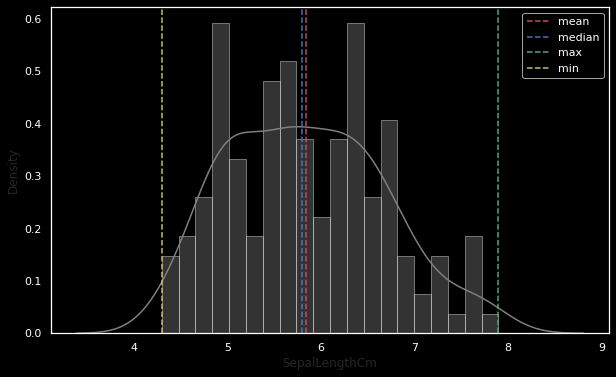

Mean of SepalLengthCm : 5.843333333333335
Median of SepalLengthCm : 5.8
Max of SepalLengthCm : 7.9
Min of SepalLengthCm : 4.3
Std of SepalLengthCm : 0.8280661279778629


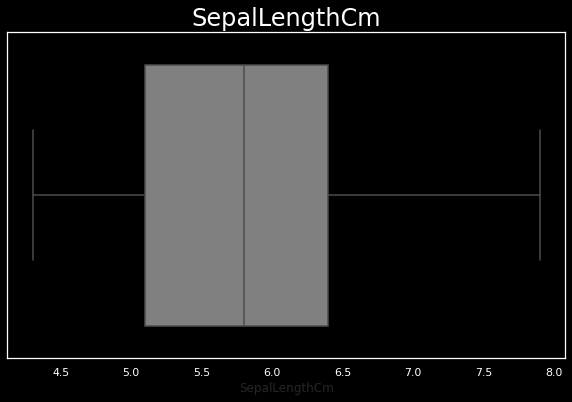

In [34]:
central_tendency('SepalLengthCm')

- with less standard deviation it can be noted that data is not spread out much.
- MAx and Min values also shows the extreme points and are not so far apart.
- Mean and Median being this close, can say that this variable is not much skewed.
- From the boxplot, 50% of the data lie where mean and median are, and there are no outliers.

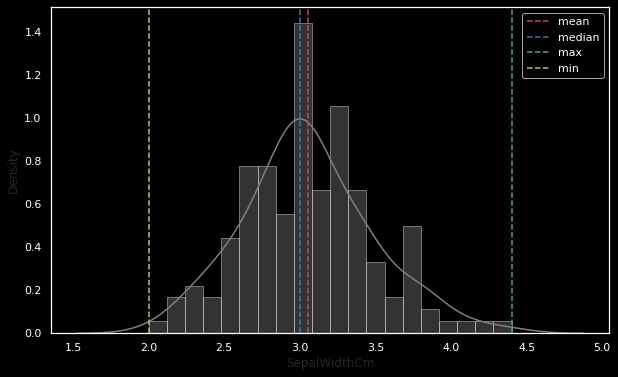

Mean of SepalWidthCm : 3.0540000000000007
Median of SepalWidthCm : 3.0
Max of SepalWidthCm : 4.4
Min of SepalWidthCm : 2.0
Std of SepalWidthCm : 0.4335943113621737


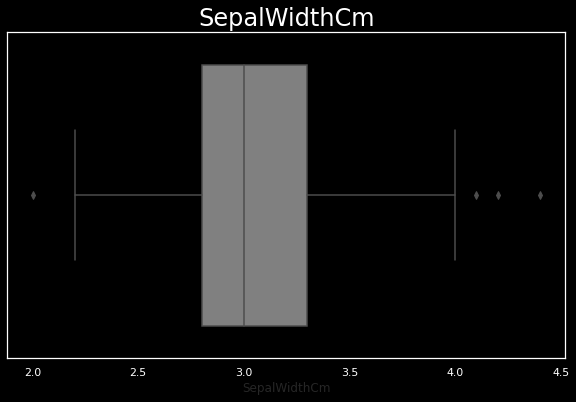

In [35]:
central_tendency('SepalWidthCm')

- There are outliers in this variable, as seen from the boxplot.
- Again, standard deviation being so less, data is not widely spread out.
- Min and Max are also close to each other.
- Again the 50% of data where mean and media are they are very close to each other.
- This variable show a normal distribution.

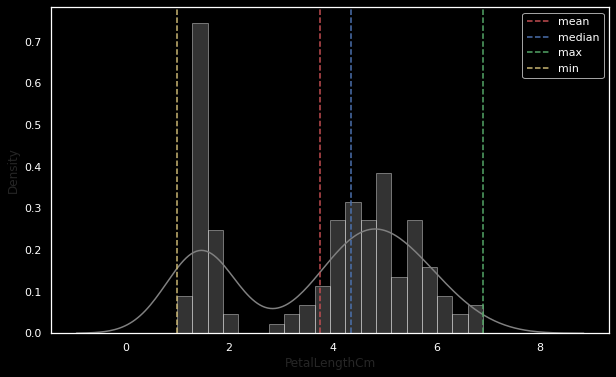

Mean of PetalLengthCm : 3.7586666666666693
Median of PetalLengthCm : 4.35
Max of PetalLengthCm : 6.9
Min of PetalLengthCm : 1.0
Std of PetalLengthCm : 1.7644204199522617


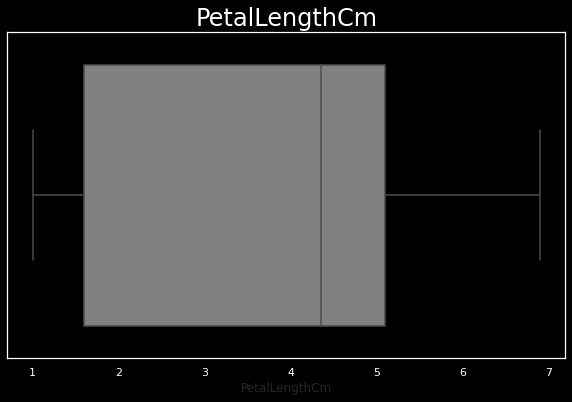

In [36]:
central_tendency('PetalLengthCm')

- Mean and median are far from each other and so is standard deviation larger, that clearly tells that data is widely spread as also it can be seen from the histogram.
- Min and Mox are also apart from each other.

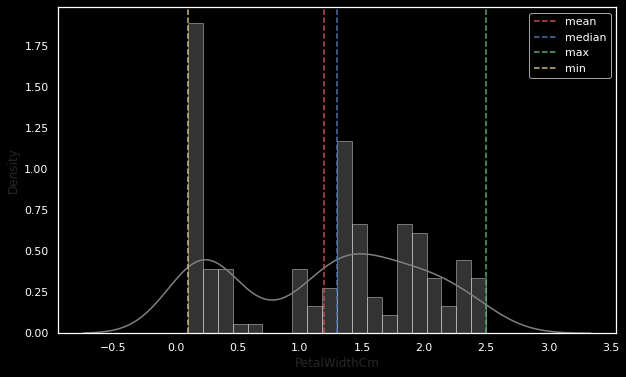

Mean of PetalWidthCm : 1.1986666666666672
Median of PetalWidthCm : 1.3
Max of PetalWidthCm : 2.5
Min of PetalWidthCm : 0.1
Std of PetalWidthCm : 0.7631607417008414


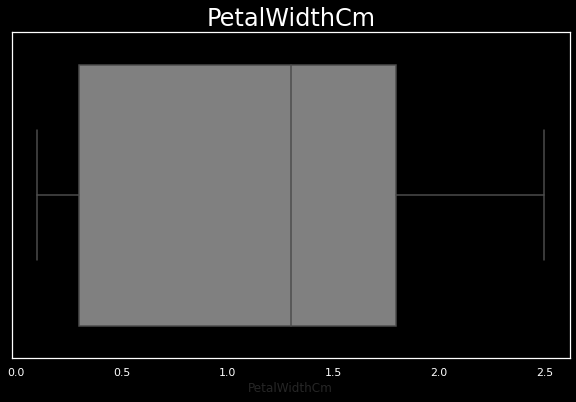

In [38]:
central_tendency('PetalWidthCm')

- It follows almost the same pattern as PatelLengthCm variable.

### Analysing further based on Species


Count per species:
Iris-versicolor    50
Iris-setosa        50
Iris-virginica     50
Name: Species, dtype: int64


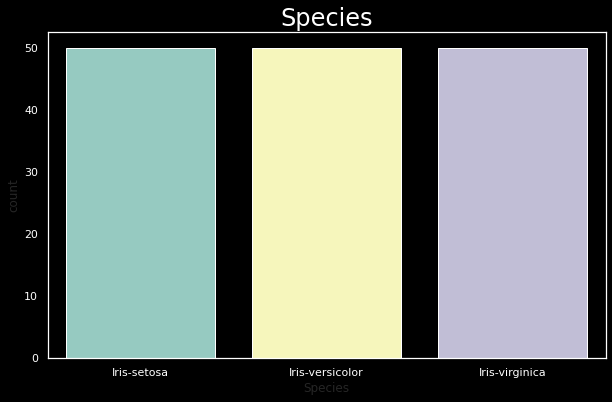

In [44]:
# seeing the target variable 
fig, ax = plt.subplots(1,1, figsize=(10,6))
sns.countplot(data=data, x='Species', palette='Set3')
ax.set_title('Species', size=24)
print('')
print('Count per species:')
print(data['Species'].value_counts())

- Target variables are well distributed, which removes the worriness of data being imbalanced and in all helping the model to learn well from the data.

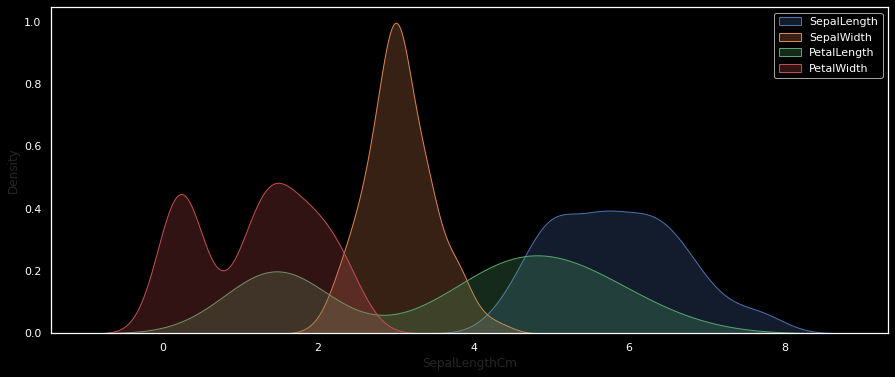

In [47]:
# distribution of the variables except from target variable
fig, ax = plt.subplots(1, 1, figsize=(15,6))
sns.kdeplot(data=iris['SepalLengthCm'], shade=True)
sns.kdeplot(data=iris['SepalWidthCm'], shade=True)
sns.kdeplot(data=iris['PetalLengthCm'], shade=True)
sns.kdeplot(data=iris['PetalWidthCm'], shade=True)
plt.legend(['SepalLength', 'SepalWidth', 'PetalLength', 'PetalWidth'])

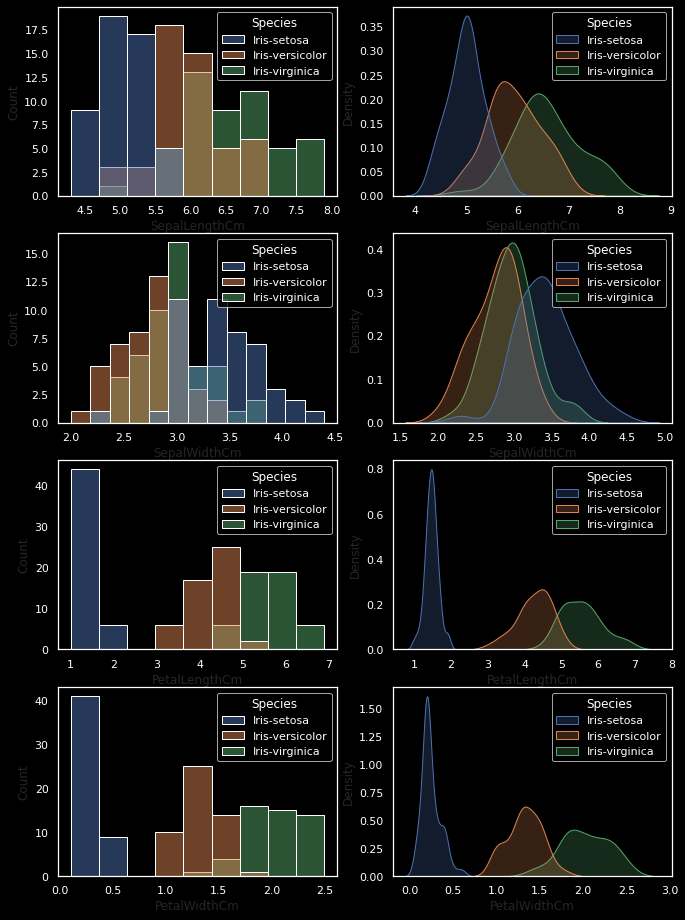

In [49]:
# distribution of target variable along with the independent features
fig, ax = plt.subplots(4, 2, figsize=(11, 16))
sns.histplot(data=iris, x='SepalLengthCm',hue='Species', ax=ax[0][0], color='b')
sns.kdeplot(data=iris, x='SepalLengthCm',hue='Species', ax=ax[0][1], shade=True, color='b')
sns.histplot(data=iris, x='SepalWidthCm', ax=ax[1][0],hue='Species', color='b')
sns.kdeplot(data=iris, x='SepalWidthCm', ax=ax[1][1],hue='Species', shade=True, color='b')
sns.histplot(data=iris, x='PetalLengthCm', ax=ax[2][0],hue='Species', color='b')
sns.kdeplot(data=iris, x='PetalLengthCm', ax=ax[2][1], hue='Species',shade=True, color='b')
sns.histplot(data=iris, x='PetalWidthCm', ax=ax[3][0],hue='Species', color='b')
sns.kdeplot(data=iris, x='PetalWidthCm', ax=ax[3][1], hue='Species',shade=True, color='b')

- Iris-setosa has smallest Sepal length while Iris-virginica has the largest.
- All the species has almost very identical Sepal width in cms.
- Iris-setosa has the smallest petal and petal width.
- Therefore, by human methods, petals that are very small and so is the sepal that means its the species belonging to the setosa class.

In [71]:
# the above mentioned facts shall be more further clear in the following graph 

fig = px.scatter(data, x='SepalLengthCm', y='SepalWidthCm', color='Species',
                 marginal_x = 'box', marginal_y='violin',
                 title='Sepal length vs sepal width')
fig.update_layout(autosize=True, width=600, height=600,)
HTML(fig.to_html())

In [72]:
fig = px.scatter(data, x='PetalLengthCm', y='PetalWidthCm', color='Species',
                 marginal_x = 'box', marginal_y='violin',
                 title='Petal length vs petal width')
fig.update_layout(autosize=True, width=600, height=600,)
HTML(fig.to_html())

In [ ]:
data['Species'] = data['Species'].replace('Iris-versicolor', 0)
data['Species'] = data['Species'].replace('Iris-virginica', 1)
data['Species'] = data['Species'].replace('Iris-setosa', 2)

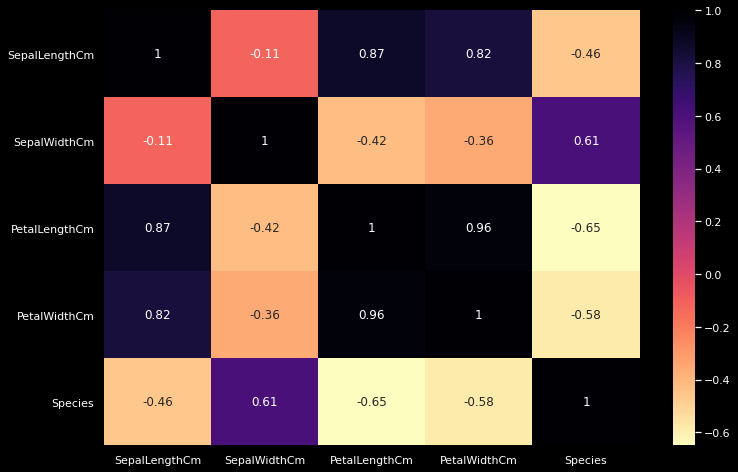

In [83]:
# seeing how each variable relates with each and also see is there is any multicolinearity,
# whcih actually we during the pandas profiling, there were none.
corr = data.drop('Id', axis=1).corr()
plt.figure(figsize=(12,8))
sns.heatmap(corr, annot=True, cmap='magma_r')

- As it can be seen that Petal length and width has a good positive relation with the sepal length. 
- Petal length and petal width are higly correlated to each other, which shows there is a multicolinearity, but upto some extent is good, so will let it remain in the model building.
- Species has a good positive correlation with sepal width.

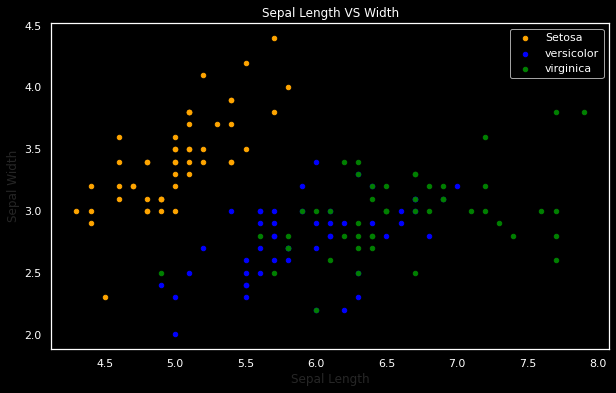

In [100]:
fig = iris[iris.Species=='Iris-setosa'].plot(kind='scatter',x='SepalLengthCm',y='SepalWidthCm',color='orange', label='Setosa')
iris[iris.Species=='Iris-versicolor'].plot(kind='scatter',x='SepalLengthCm',y='SepalWidthCm',color='blue', label='versicolor',ax=fig)
iris[iris.Species=='Iris-virginica'].plot(kind='scatter',x='SepalLengthCm',y='SepalWidthCm',color='green', label='virginica', ax=fig)
fig.set_xlabel("Sepal Length")
fig.set_ylabel("Sepal Width")
fig.set_title("Sepal Length VS Width")
fig=plt.gcf()
fig.set_size_inches(10,6)
plt.show()

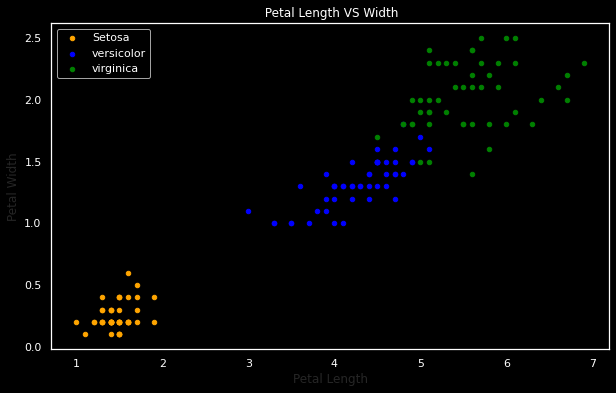

In [101]:
fig = iris[iris.Species=='Iris-setosa'].plot.scatter(x='PetalLengthCm',y='PetalWidthCm',color='orange', label='Setosa')
iris[iris.Species=='Iris-versicolor'].plot.scatter(x='PetalLengthCm',y='PetalWidthCm',color='blue', label='versicolor',ax=fig)
iris[iris.Species=='Iris-virginica'].plot.scatter(x='PetalLengthCm',y='PetalWidthCm',color='green', label='virginica', ax=fig)
fig.set_xlabel("Petal Length")
fig.set_ylabel("Petal Width")
fig.set_title(" Petal Length VS Width")
fig=plt.gcf()
fig.set_size_inches(10,6)
plt.show()

## STATISTICAL TESTS


### T test (one sample test)

The one-sample t-test is a statistical hypothesis test used to determine whether an unknown population mean is different from a specific value.

* H0 := The mean of distribution is same.
* H1 := There is difference in mean of the distribution.

Assumptions:
* The data values are independent. 
* The measurements are continuous.
* Our sample is normally distributed.

In [85]:
from scipy import stats
print(f"Mean of Sepal length in cms: {iris['SepalLengthCm'].mean()}")

Mean of Sepal length in cms: 5.843333333333335


In [86]:
h0 = 9
test_result, pval = stats.ttest_1samp(iris['SepalLengthCm'], h0)

if pval < 0.05:
  print('We reject the null hypothesis and there is differnce in mean of the sample distribution and null hypothesis.')
else:
  print('We failed to reject null hypothesis, mean difference is same')

We reject the null hypothesis and there is differnce in mean of the sample distribution and null hypothesis.


In [88]:
h0 = 5.9
test_result, pval = stats.ttest_1samp(iris['SepalLengthCm'], h0)

if pval < 0.05:
  print('We reject the null hypothesis and there is differnce in mean of the sample distribution and null hypothesis.')
else:
  print('We failed to reject null hypothesis, mean difference is same')

We failed to reject null hypothesis, mean difference is same


In [89]:
h0 = 3.5
test_result, pval = stats.ttest_1samp(iris['SepalLengthCm'], h0)

if pval < 0.05:
  print('We reject the null hypothesis and there is differnce in mean of the sample distribution and null hypothesis.')
else:
  print('We failed to reject null hypothesis, mean difference is same')

We reject the null hypothesis and there is differnce in mean of the sample distribution and null hypothesis.


- it is clear too since when we use 5.5 or 9 as null hypothesis mean it was not near to the mean of data sample  but 5.9 was the nearest so it has high probability that the mean we have is of the sample than the other sample 

### T test (2 sample test)

* A t-test is a type of inferential statistic used to determine if there is a significant difference between the means of two groups, which may be related in certain features.

T-Test Assumptions
* The first assumption made regarding t-tests concerns the scale of measurement. The assumption for a t-test is that the scale of measurement applied to the data collected follows a continuous or ordinal scale, such as the scores for an IQ test.
* The second assumption made is that of a simple random sample, that the data is collected from a representative, randomly selected portion of the total population.
* The third assumption is the data, when plotted, results in a normal distribution, bell-shaped distribution curve.
* The final assumption is the homogeneity of variance. Homogeneous, or equal, variance exists when the standard deviations of samples are approximately equal.

* H0 := 2 independent samples have identical average (expected) values
* H1 := 2 independent samples have different means.

In [91]:
# petal length and sepal length

test_result, pval = stats.ttest_ind(iris['SepalLengthCm'], iris['PetalLengthCm'])

if pval < 0.05:
  print('Reject the null hypothesis and there is a difference of means.')
else:
  print('Failed to reject the null hypothesis and it shows that the differnce is same.')

Reject the null hypothesis and there is a difference of means.


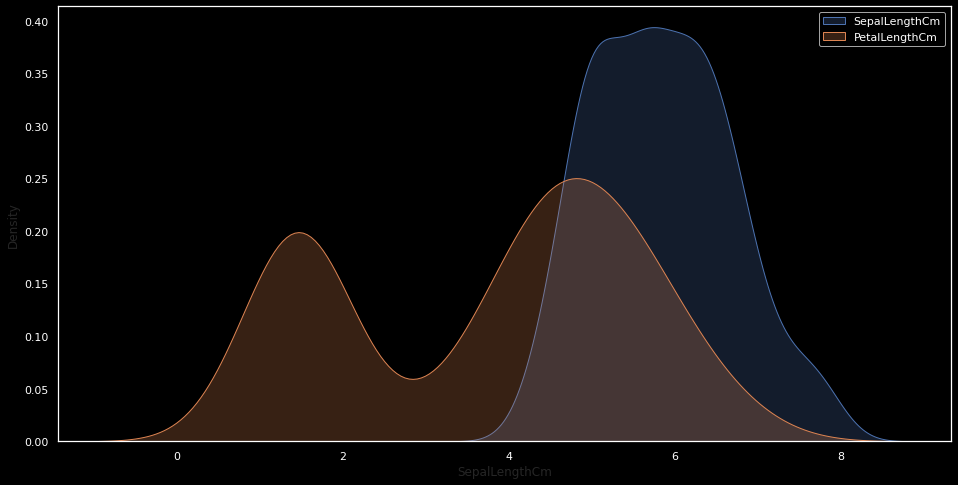

In [92]:
fig, ax = plt.subplots(1,1,figsize=(16, 8))
sns.kdeplot(iris['SepalLengthCm'], shade=True)
sns.kdeplot(iris['PetalLengthCm'], shade=True)
ax.legend(['SepalLengthCm', 'PetalLengthCm'])

### ANOVA test

* Analysis of variance (ANOVA) is a statistical technique that is used to check if the means of two or more groups are significantly different from each other. ANOVA checks the impact of one or more factors by comparing the means of different samples.
* One-way has one independent variable (with 2 levels). For example: brand of cereal,
* Two-way has two independent variables (it can have multiple levels). For example: brand of cereal, calories.

In [93]:
groups = iris.groupby('Species').groups
groups

{0: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99], 1: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149], 2: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]}

In [94]:
zero = groups[0]
one = groups[1]
two = groups[2]

stat, pval = stats.f_oneway(zero, one, two)

if pval < 0.05: 
    print(f"WE  reject null hypothesis : Atleast one mean of category group differs from atleast one other category group")
else: 
    print(f"Null hypothesis is true : There is no difference in the mean of categories")
print(stat, pval)

WE  reject null hypothesis : Atleast one mean of category group differs from atleast one other category group
588.2352941176471 7.109244831853909e-71


## FEATURE ENGINEERING

Feature scaling not required as trees just splits the data based on the information, if there were other algorithms, feature scalling would have been important for faster preocessing speeds.

## SPLITTING DATA

Now the given problem is a classification problem.. Thus will be using the classification algorithms to build a model.

Classification: samples belong to two or more classes and we want to learn from already labeled data how to predict the class of unlabeled data

In [102]:
# LABELLING TARGET VARIABLES
data['Species'] = data['Species'].replace('Iris-versicolor', 0)
data['Species'] = data['Species'].replace('Iris-virginica', 1)
data['Species'] = data['Species'].replace('Iris-setosa', 2)

In [105]:
# splitting into independent and dependent variables
x = data.drop(['Species', 'Id'], axis=1)
x.head()

,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [106]:
y = data['Species']
y.head()

0    Iris-setosa
1    Iris-setosa
2    Iris-setosa
3    Iris-setosa
4    Iris-setosa
Name: Species, dtype: object

In [108]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=4)
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((120, 4), (30, 4), (120,), (30,))

In [152]:
!pip install sweetviz

     |████████████████████████████████| 15.1MB 274kB/s 


In [153]:
# comparing train and test set
import sweetviz as sv
compare_report = sv.compare([x_train, 'Train'], [x_test, 'Test'])
compare_report.show_html('compare_html', open_browser=False)

                                             |          | [  0%]   00:00 -> (? left)

Report compare_html was generated.



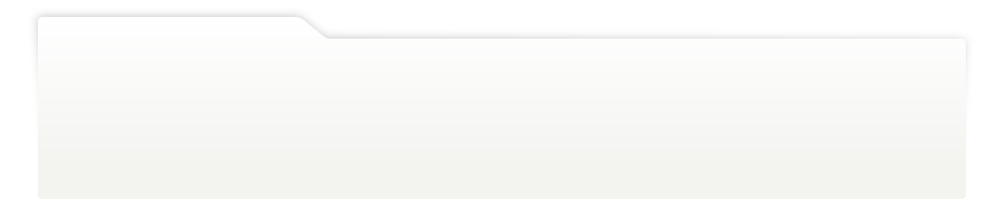
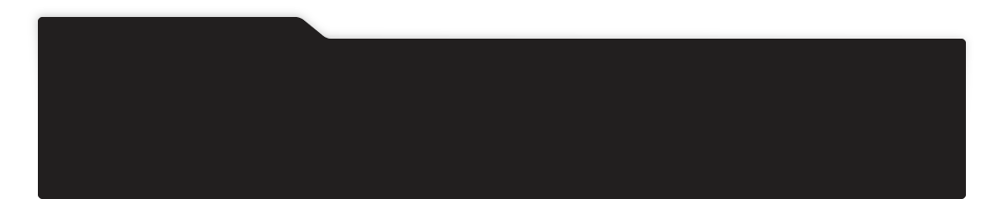
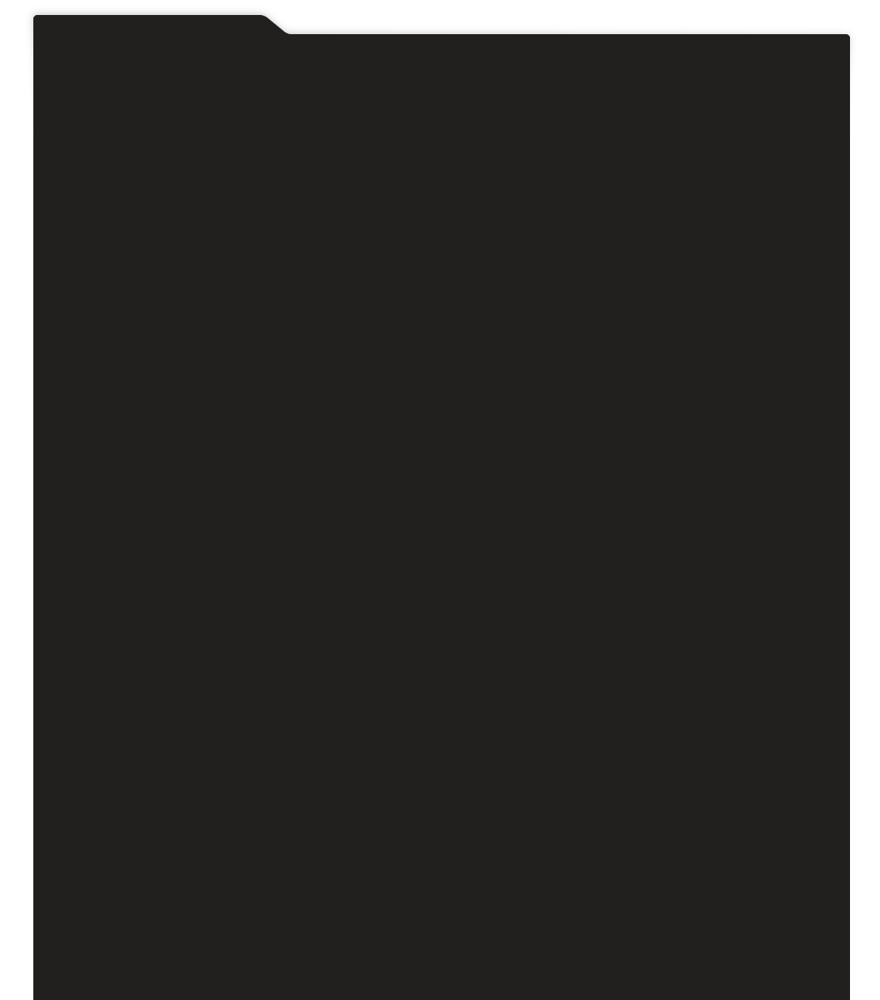
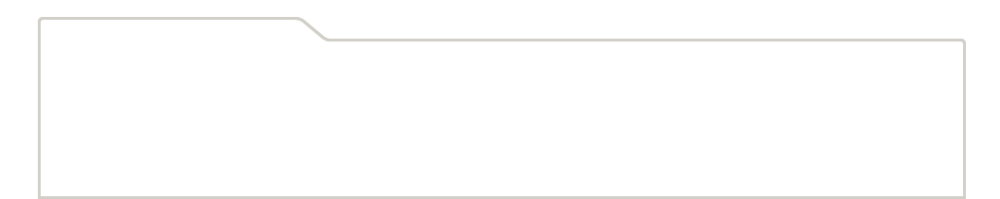
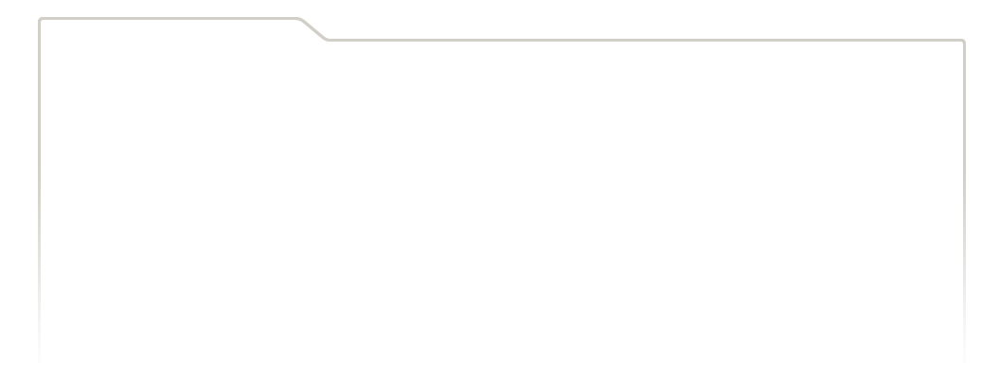
...
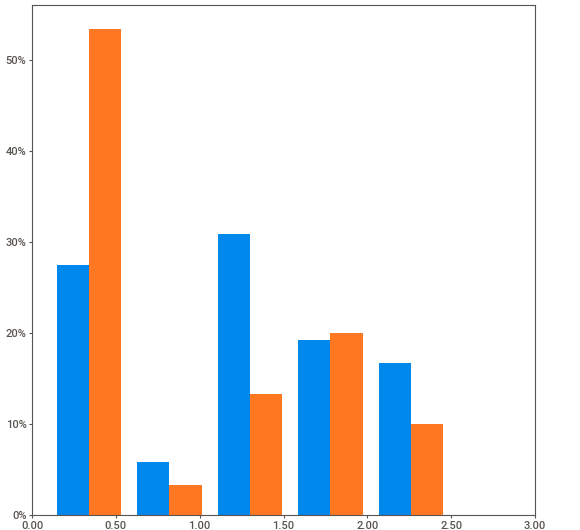
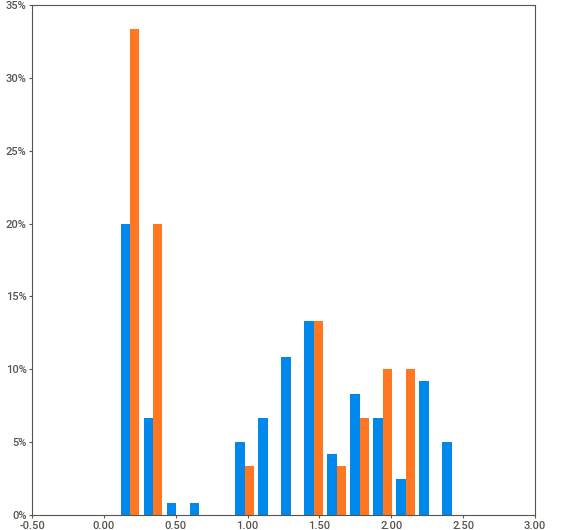
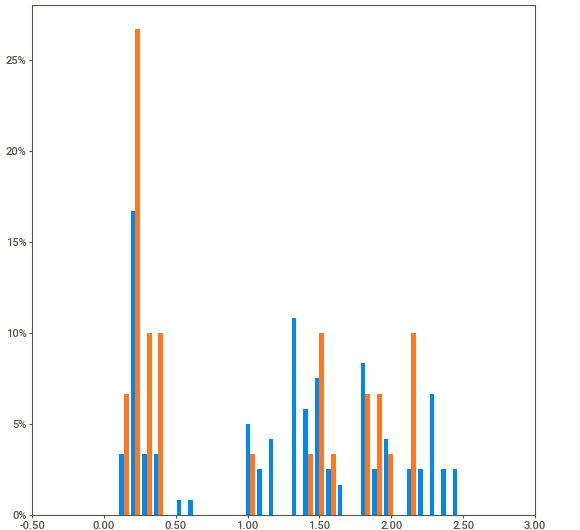
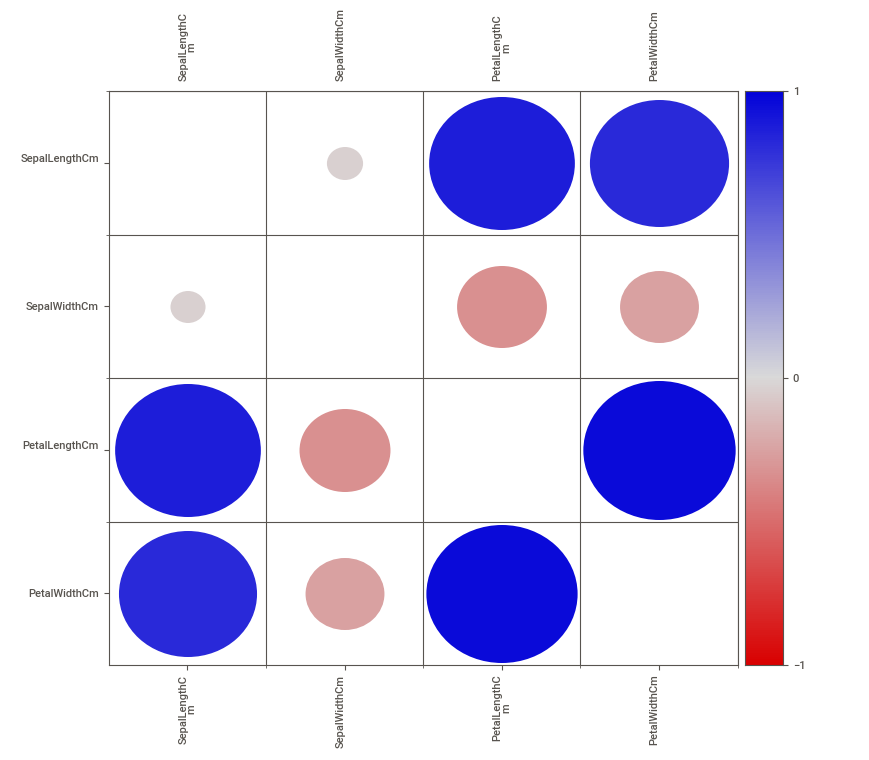
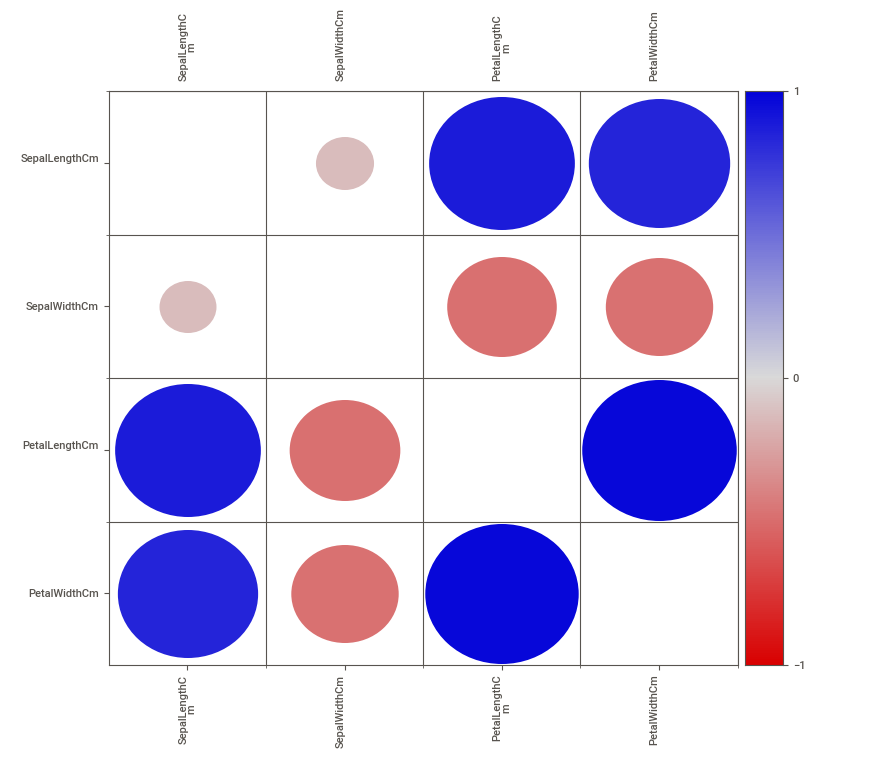

In [154]:
import IPython
IPython.display.HTML('compare_html')

## DECISION TREE

Decision Tree Terminologies
* Root Node: Root node is from where the decision tree starts. It represents the entire dataset, which further gets divided into two or more homogeneous sets.
* Leaf Node: Leaf nodes are the final output node, and the tree cannot be segregated further after getting a leaf node.
* Splitting: Splitting is the process of dividing the decision node/root node into sub-nodes according to the given conditions.
* Branch/Sub Tree: A tree formed by splitting the tree.
* Pruning: Pruning is the process of removing the unwanted branches from the tree.
* Parent/Child node: The root node of the tree is called the parent node, and other nodes are called the child nodes.
How does the Decision Tree algorithm Work?

In a decision tree, for predicting the class of the given dataset, the algorithm starts from the root node of the tree. This algorithm compares the values of root attribute with the record (real dataset) attribute and, based on the comparison, follows the branch and jumps to the next node.

For the next node, the algorithm again compares the attribute value with the other sub-nodes and move further. It continues the process until it reaches the leaf node of the tree. The complete process can be better understood using the below algorithm:

* Step-1: Begin the tree with the root node, says S, which contains the complete dataset.
* Step-2: Find the best attribute in the dataset using Attribute Selection Measure (ASM).
* Step-3: Divide the S into subsets that contains possible values for the best attributes.
* Step-4: Generate the decision tree node, which contains the best attribute.
* Step-5: Recursively make new decision trees using the subsets of the dataset created in step -3. Continue this process until a stage is reached where you cannot further classify the nodes and called the final node as a leaf node.

Attribute Selection Measures

While implementing a Decision tree, the main issue arises that how to select the best attribute for the root node and for sub-nodes. So, to solve such problems there is a technique which is called as Attribute selection measure or ASM. By this measurement, we can easily select the best attribute for the nodes of the tree. There are two popular techniques for ASM, which are:

* Information Gain
* Gini Index

1. Information Gain:

  * Information gain is the measurement of changes in entropy after the segmentation of a dataset based on an attribute.
  * It calculates how much information a feature provides us about a class.
  * According to the value of information gain, we split the node and build the decision tree.
  * A decision tree algorithm always tries to maximize the value of information gain, and a node/attribute having the highest information gain is split first. It can be calculated using the below formula:
  
Information Gain= Entropy(S)- [(Weighted Avg) *Entropy(each feature)

Entropy: Entropy is a metric to measure the impurity in a given attribute. It specifies randomness in data. Entropy can be calculated as:

Entropy(s)= -P(yes)log2 P(yes)- P(no) log2 P(no)

Where,

S= Total number of samples

P(yes)= probability of yes

P(no)= probability of no

2. Gini Index:
* Gini index is a measure of impurity or purity used while creating a decision tree in the CART(Classification and Regression Tree) algorithm.
* An attribute with the low Gini index should be preferred as compared to the high Gini index.
* It only creates binary splits, and the CART algorithm uses the Gini index to create binary splits.
* Gini index can be calculated using the below formula:
* Gini Index= 1- ∑jPj2

Pruning: Getting an Optimal Decision tree
* Pruning is a process of deleting the unnecessary nodes from a tree in order to get the optimal decision tree.

* A too-large tree increases the risk of overfitting, and a small tree may not capture all the important features of the dataset. Therefore, a technique that decreases the size of the learning tree without reducing accuracy is known as Pruning. There are mainly two types of tree pruning technology used:

  * Cost Complexity Pruning
  * Reduced Error Pruning.

Advantages of the Decision Tree
* It is simple to understand as it follows the same process which a human follow while making any decision in real-life.

* It can be very useful for solving decision-related problems.
* It helps to think about all the possible outcomes for a problem.
* There is less requirement of data cleaning compared to other algorithms.

Disadvantages of the Decision Tree
* The decision tree contains lots of layers, which makes it complex.
* It may have an overfitting issue, which can be resolved using the Random Forest algorithm.
* For more class labels, the computational complexity of the decision tree may increase.

### Gini index

In [122]:
from sklearn.tree import DecisionTreeClassifier

dt_gini = DecisionTreeClassifier(criterion='gini', random_state=4)
dt_gini.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=4, splitter='best')

In [132]:
!pip install dtreeviz

     |████████████████████████████████| 61kB 3.2MB/s 
  Created wheel for dtreeviz: filename=dtreeviz-1.3-cp37-none-any.whl size=66640 sha256=76bac75650bfc805c8fadf7f5896066fd7ad707806081d438baafb51fbf7fb3a
  Stored in directory: /root/.cache/pip/wheels/60/36/b1/188ee35c677e48463f6482d580f81c19f5f82ae5adbe293fd8
Successfully built dtreeviz


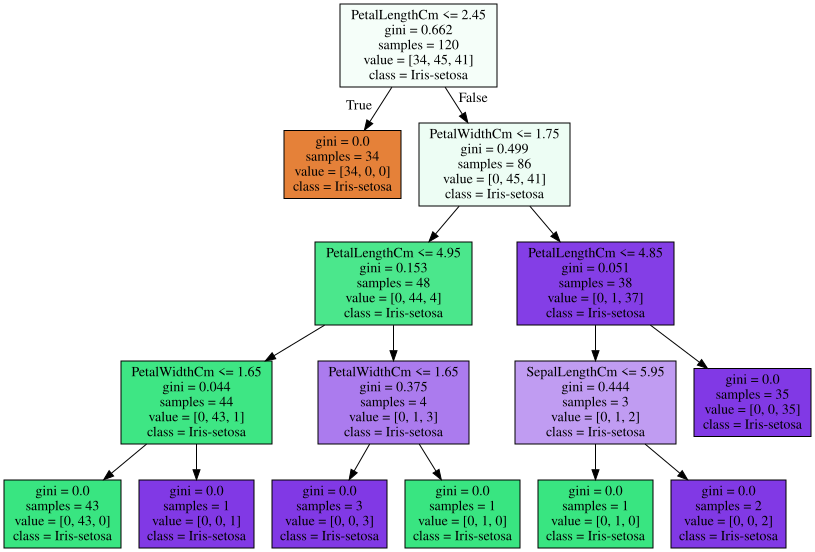

In [144]:
import graphviz

dot_data = tree.export_graphviz(dt_gini, out_file=None, 
                                feature_names=x.columns,  
                                class_names=y,
                                filled=True)

# Draw graph
graph = graphviz.Source(dot_data, format="png") 
graph

In [145]:
print(tree.export_text(dt_gini))

|--- feature_2 <= 2.45
|   |--- class: Iris-setosa
|--- feature_2 >  2.45
|   |--- feature_3 <= 1.75
|   |   |--- feature_2 <= 4.95
|   |   |   |--- feature_3 <= 1.65
|   |   |   |   |--- class: Iris-versicolor
|   |   |   |--- feature_3 >  1.65
|   |   |   |   |--- class: Iris-virginica
|   |   |--- feature_2 >  4.95
|   |   |   |--- feature_3 <= 1.65
|   |   |   |   |--- class: Iris-virginica
|   |   |   |--- feature_3 >  1.65
|   |   |   |   |--- class: Iris-versicolor
|   |--- feature_3 >  1.75
|   |   |--- feature_2 <= 4.85
|   |   |   |--- feature_0 <= 5.95
|   |   |   |   |--- class: Iris-versicolor
|   |   |   |--- feature_0 >  5.95
|   |   |   |   |--- class: Iris-virginica
|   |   |--- feature_2 >  4.85
|   |   |   |--- class: Iris-virginica



In [148]:
# predicting 
from sklearn.metrics import accuracy_score
predictions = dt_gini.predict(x_test)
print(f'accuracy : {accuracy_score(y_test, predictions)}')

accuracy : 0.9666666666666667


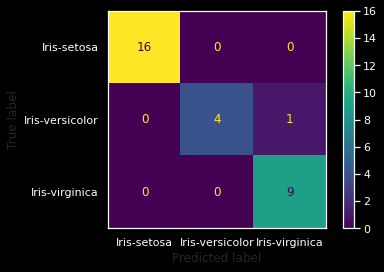

In [149]:
from sklearn.datasets import make_classification
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(dt, x_test, y_test)  
plt.show()  

In [150]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions))

                 precision    recall  f1-score   support

    Iris-setosa       1.00      1.00      1.00        16
Iris-versicolor       1.00      0.80      0.89         5
 Iris-virginica       0.90      1.00      0.95         9

       accuracy                           0.97        30
      macro avg       0.97      0.93      0.95        30
   weighted avg       0.97      0.97      0.97        30



In [155]:
# checking for over fitting 
print('Training set score: {:.4f}'.format(dt_gini.score(x_train, y_train)))
print()
print('Test set score: {:.4f}'.format(dt_gini.score(x_test, y_test)))

Training set score: 1.0000

Test set score: 0.9667


The model is performing well on the train set but not on test set, that means the model is overfitted.

### Entropy

In [156]:
dt_en = DecisionTreeClassifier(criterion='entropy', random_state=4)
dt_en.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=4, splitter='best')

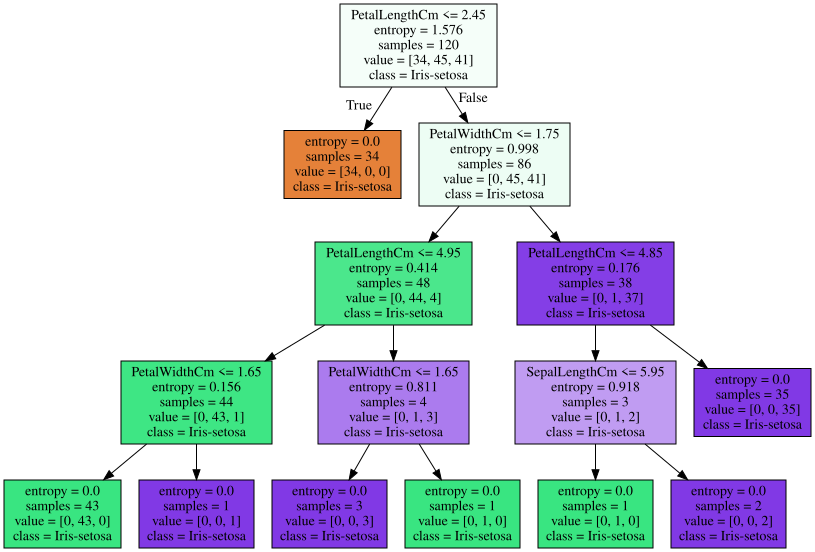

In [157]:
import graphviz

dot_data = tree.export_graphviz(dt_en, out_file=None, 
                                feature_names=x.columns,  
                                class_names=y,
                                filled=True)

# Draw graph
graph = graphviz.Source(dot_data, format="png") 
graph

In [158]:
predictions = dt_en.predict(x_test)
print(f'accuracy : {accuracy_score(y_test, predictions)}')

accuracy : 0.9666666666666667


In [159]:
# checking for over fitting 
print('Training set score: {:.4f}'.format(dt_en.score(x_train, y_train)))
print()
print('Test set score: {:.4f}'.format(dt_en.score(x_test, y_test)))

Training set score: 1.0000

Test set score: 0.9667
